# Impact calculations with data from OpenStreetMap
## Paper Sketch openstreetmap & lines_polys_handler modules

In [1]:
import matplotlib.pyplot as plt
import shapely
import contextily as ctx
from pathlib import Path
from datetime import datetime
import numpy as np
import pandas as pd

from climada.util.api_client import Client
import climada.util.lines_polys_handler as u_lp
from climada.engine.impact_calc import ImpactCalc
from climada.entity.impact_funcs import ImpactFuncSet, ImpactFunc
from climada.entity.impact_funcs.storm_europe import ImpfStormEurope
from climada.entity import Exposures
from climada.entity import LitPop
from climada import CONFIG

from climada_petals.entity.exposures.openstreetmap.osm_dataloader import OSMRaw, OSMFileQuery
from climada_petals.entity.exposures.openstreetmap.osm_dataloader import DICT_CIS_OSM

### Getting OSM Files

In [2]:
# download osm.pbf file for Switzerland from geofabrik
DATA_DIR = CONFIG.exposures.openstreetmap.local_data.dir()
OSMRaw().get_data_geofabrik('CHE', file_format='pbf', save_path=DATA_DIR)

### Extracting geo-data from OSM files

In [3]:
# Initiate a OSMFileQuery instance with path to the downloaded file
SwissFileQuery = OSMFileQuery(Path(DATA_DIR, 'switzerland-latest.osm.pbf'))

## Cultural heritage 

In [92]:
natural_query = {
    'osm_keys': ['protect_class', 'name'],
    'osm_query': "protect_class='1' or protect_class='2' or protect_class='3' or protect_class='97' or protect_class='98'"
}

In [93]:
gdf_list = []
for shape in ['points', 'lines', 'multipolygons']:
    try:
        gdf = SwissFileQuery.retrieve(shape, natural_query['osm_keys'], natural_query['osm_query'])
        gdf_list.append(gdf)
    except TypeError:
        print(f'{shape} not found')
gdf_natural = pd.concat(gdf_list)
gdf_natural

extract points: 0it [00:11, ?it/s]
extract lines: 0it [00:14, ?it/s]
extract multipolygons: 100%|█████████████████████████████████████████████████| 6/6 [00:46<00:00,  7.70s/it]


,osm_id,protect_class,name,geometry
0,300032,2,Parco Nazionale dello Stelvio - Nationalpark S...,"MULTIPOLYGON (((10.52546 46.27314, 10.52499 46..."
1,5422383,97,Europaschutzgebiet Bangs-Matschels,"MULTIPOLYGON (((9.53208 47.26947, 9.53213 47.2..."
2,None,1,Fridolins-Insel,"MULTIPOLYGON (((7.95093 47.54969, 7.95083 47.5..."
3,None,97,Rheindelta,"MULTIPOLYGON (((9.57925 47.48544, 9.57890 47.4..."
4,None,1,None,"MULTIPOLYGON (((9.64246 46.52345, 9.64003 46.5..."
5,None,3,Ägelsee,"MULTIPOLYGON (((8.86154 47.55725, 8.86202 47.5..."


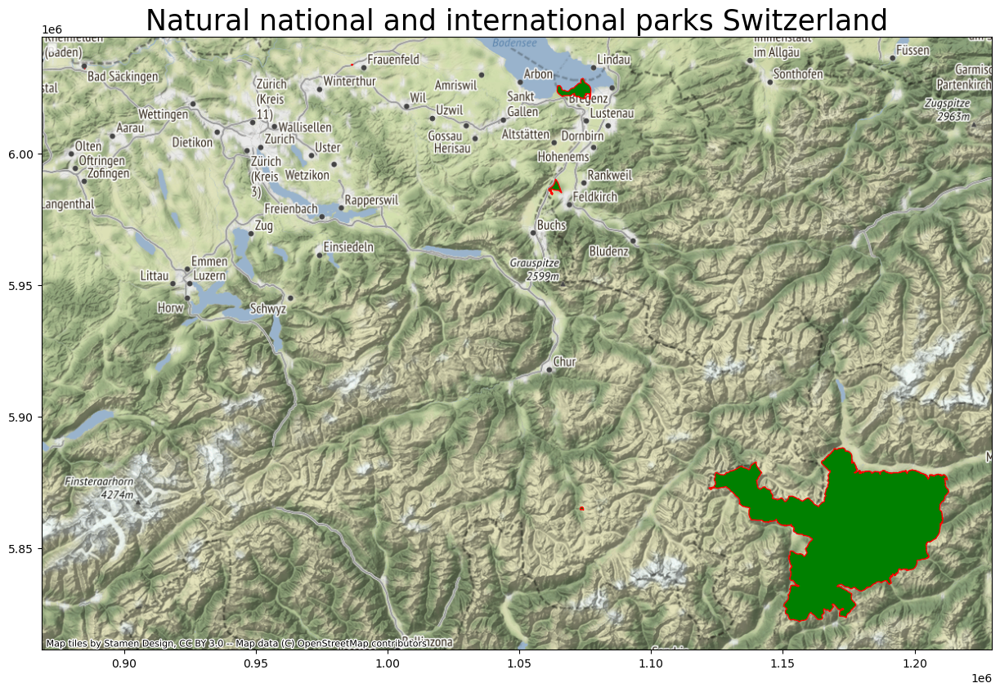

In [94]:
# plot results
ax = gdf_natural.set_crs(epsg=4326).to_crs(epsg=3857).plot(figsize=(15, 15), alpha=1, markersize=5, color='green', 
                    edgecolor='red', label='Natural park')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, loc='upper left')
ax.set_title(f'Natural national and international parks Switzerland', fontsize=25)
ctx.add_basemap(ax)
plt.show()

In [79]:
cultural_query = {
    'osm_keys': ['protect_class', 'name'],
    'osm_query': "protect_class='22'"
}

In [80]:
gdf_list = []
for shape in ['points', 'lines', 'multipolygons']:
    try:
        gdf = SwissFileQuery.retrieve(shape, cultural_query['osm_keys'], cultural_query['osm_query'])
        gdf_list.append(gdf)
    except TypeError:
        print(f'{shape} not found')
gdf_cultural = pd.concat(gdf_list)
gdf_cultural

extract points: 0it [00:05, ?it/s]
extract lines: 0it [00:09, ?it/s]
extract multipolygons: 100%|███████████████████████████████████████████████| 10/10 [00:49<00:00,  4.99s/it]


,osm_id,protect_class,name,geometry
0,None,22,Kirche St. Kosmas & Damian,"MULTIPOLYGON (((8.01721 47.51896, 8.01722 47.5..."
1,None,22,Schwedenhaus,"MULTIPOLYGON (((8.01516 47.51984, 8.01525 47.5..."
2,None,22,Schönauer Schlössli,"MULTIPOLYGON (((8.01682 47.51922, 8.01681 47.5..."
3,None,22,Sankt Martin,"MULTIPOLYGON (((9.43704 47.51504, 9.43745 47.5..."
4,None,22,Schloss Arbon,"MULTIPOLYGON (((9.43655 47.51576, 9.43656 47.5..."
5,None,22,Nepomukstatue,"MULTIPOLYGON (((8.01249 47.51867, 8.01250 47.5..."
6,None,22,Bebauung Peisel,"MULTIPOLYGON (((8.82747 46.69732, 8.82693 46.6..."
7,None,22,Ortsbild Segnes,"MULTIPOLYGON (((8.82800 46.69533, 8.82744 46.6..."
8,None,22,Ortsbild \tCuraglia (Medel),"MULTIPOLYGON (((8.85912 46.67485, 8.85760 46.6..."
9,None,22,Maison ouvrières La Cité,"MULTIPOLYGON (((7.15697 47.36489, 7.15703 47.3..."


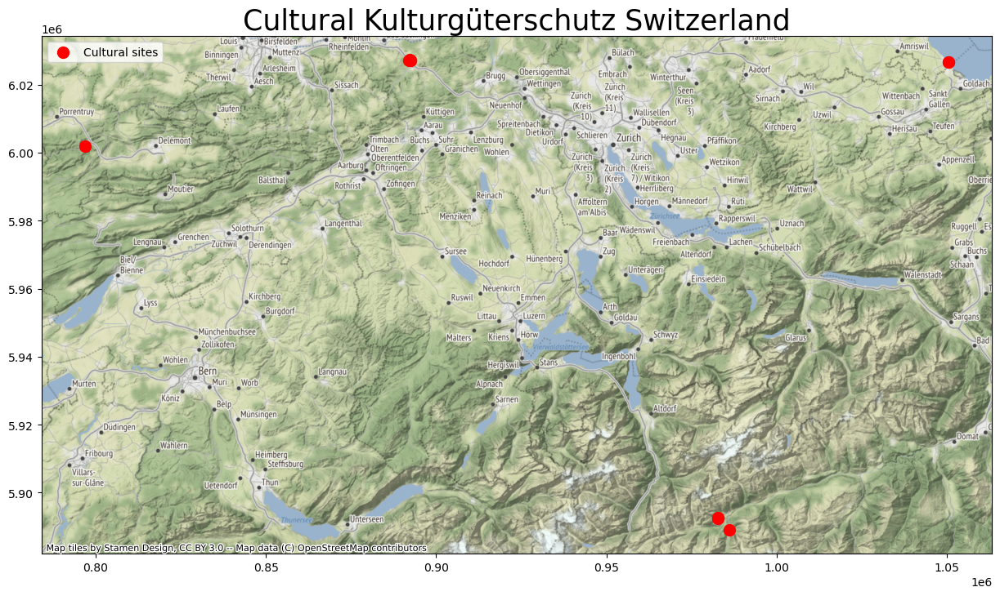

In [91]:
# plot results
gdf_cultural = gdf_cultural.copy()
gdf_cultural.geometry = gdf_cultural.geometry.centroid
ax = gdf_cultural.set_crs(epsg=4326).to_crs(epsg=3857).plot(figsize=(15, 15), alpha=1, markersize=100, color='red', 
                    edgecolor='red', label='Cultural sites')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, loc='upper left')
ax.set_title(f'Cultural Kulturgüterschutz Switzerland', fontsize=25)
ctx.add_basemap(ax)
plt.show()

In [72]:
unesco_query = {
    'osm_keys': ['heritage_operator', 'name', 'heritage'],
    'osm_query': "heritage_operator='whc'"
}

In [73]:
gdf_list = []
for shape in ['points', 'lines', 'multipolygons']:
    try:
        gdf = SwissFileQuery.retrieve(shape, unesco_query['osm_keys'], unesco_query['osm_query'])
        gdf_list.append(gdf)
    except TypeError:
        print(f'{shape} not found')
gdf_unesco = pd.concat(gdf_list)
gdf_unesco

extract points: 100%|████████████████████████████████████████████████████████| 8/8 [00:05<00:00,  1.47it/s]
extract lines: 0it [00:08, ?it/s]
extract multipolygons: 100%|█████████████████████████████████████████████████| 3/3 [00:37<00:00, 12.54s/it]


,osm_id,heritage_operator,name,heritage,geometry
0,26863957,whc,Monte San Giorgio,1,POINT (8.94989 45.91376)
1,1453589407,whc,Morges - Les Roseaux,1,POINT (6.50810 46.51484)
2,1453589408,whc,Morges - Stations de Morges,1,POINT (6.50258 46.50943)
3,2194901120,whc,Altstadt,1,POINT (7.45127 46.94829)
4,2195309046,whc,UNESCO-Welterbe - Lobsigesee,1,POINT (7.29772 47.03162)
5,3256406527,whc,Castelgrande,1,POINT (9.02175 46.19290)
6,3256443027,whc,Castello di Montebello,1,POINT (9.02657 46.19129)
7,3256443038,whc,Castello di Sasso Corbaro,1,POINT (9.03013 46.18812)
0,None,whc,Stiftsbezirk,1,"MULTIPOLYGON (((9.37641 47.42251, 9.37605 47.4..."
1,None,whc,Stiftskirche,1,"MULTIPOLYGON (((9.37747 47.42317, 9.37722 47.4..."


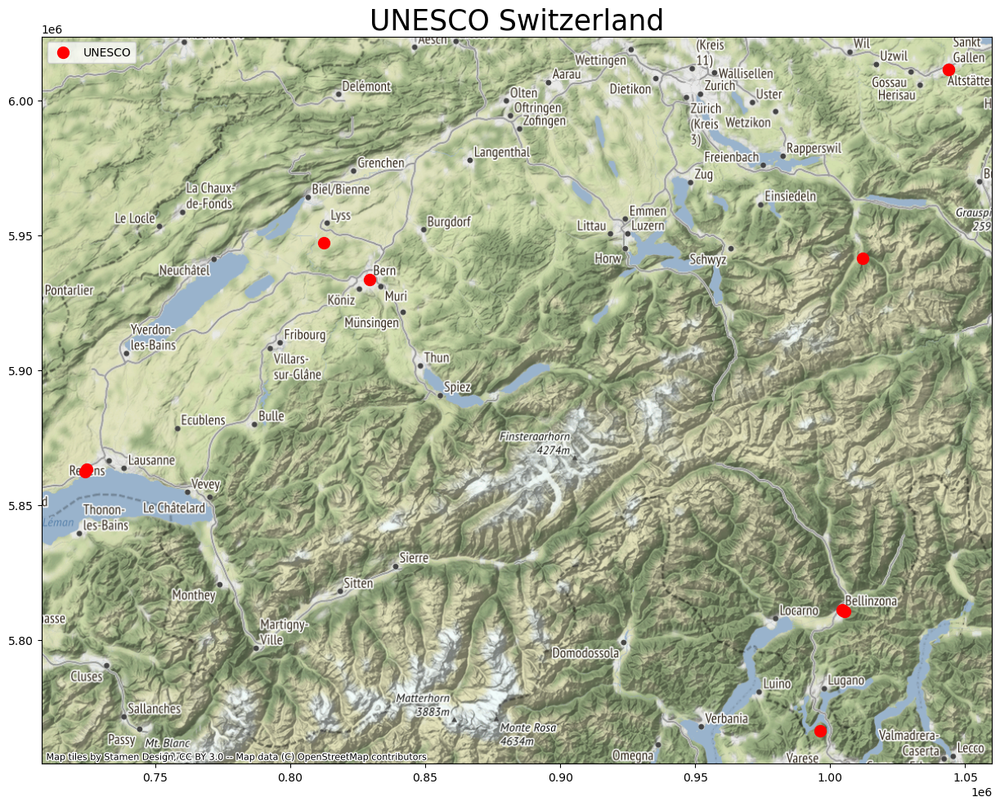

In [90]:
# plot results
gdf_unesco_plot = gdf_unesco.copy()
gdf_unesco_plot.geometry = gdf_hunesco_plot.geometry.centroid
ax = gdf_unesco_plot.set_crs(epsg=4326).to_crs(epsg=3857).plot(figsize=(15, 15), alpha=1, markersize=100, color='red', 
                    edgecolor='red', label='UNESCO')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, loc='upper left')
ax.set_title('UNESCO Switzerland', fontsize=25)
ctx.add_basemap(ax)
plt.show()

In [99]:
heritage_query = {
    'osm_keys': ['heritage', 'name'],
    'osm_query': "heritage='1' or heritage='2' or heritage='3' or heritage='4'"
}

In [100]:
gdf_list = []
for shape in ['points', 'lines', 'multipolygons']:
    try:
        gdf = SwissFileQuery.retrieve(shape, heritage_query['osm_keys'], heritage_query['osm_query'])
        gdf_list.append(gdf)
    except TypeError:
        print(f'{shape} not found')
gdf_heritage = pd.concat(gdf_list)
gdf_heritage

extract multipolygons: 100%|█████████████████████████████████████████████| 358/358 [00:44<00:00,  7.98it/s]


,osm_id,heritage,name,geometry
0,26863957,1,Monte San Giorgio,POINT (8.94989 45.91376)
1,290798579,2,Siedlung Halen,POINT (7.41335 46.97257)
2,600906623,2,Musikbibliothek,POINT (7.46028 46.95522)
3,775761161,2,Ruine Haldenstein,POINT (9.52351 46.88045)
4,815443389,2,Schweizerische Theatersammlung,POINT (7.43643 46.94915)
...,...,...,...,...
353,None,4,None,"MULTIPOLYGON (((9.07712 47.09002, 9.07708 47.0..."
354,None,4,None,"MULTIPOLYGON (((9.07686 47.08996, 9.07681 47.0..."
355,None,4,None,"MULTIPOLYGON (((9.07629 47.09590, 9.07628 47.0..."
356,None,4,None,"MULTIPOLYGON (((9.07654 47.10454, 9.07654 47.1..."


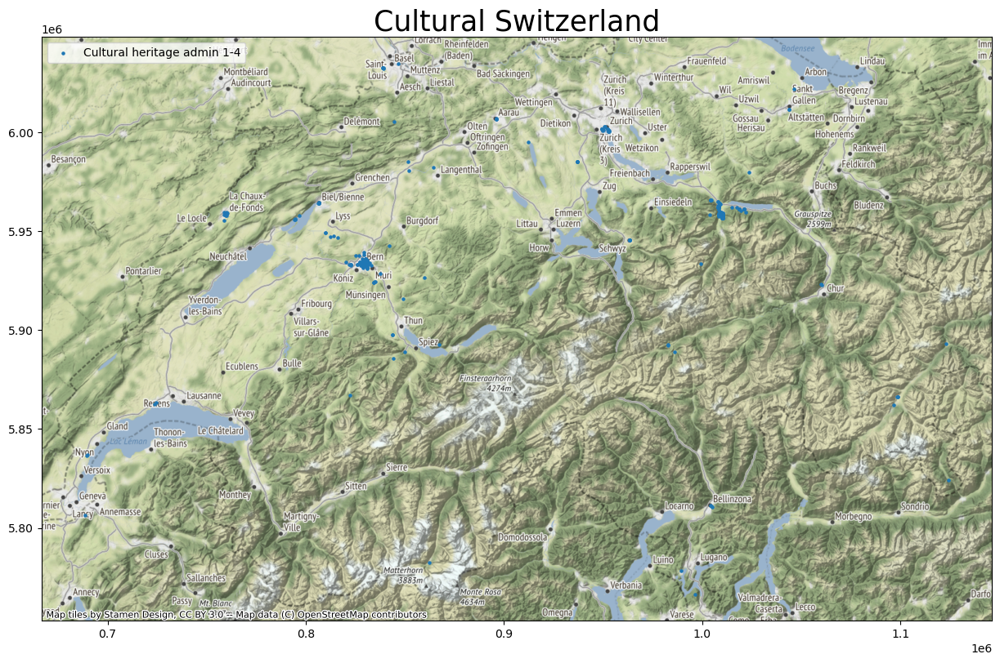

In [ ]:
# plot results
gdf_heritage_plot = gdf_heritage.copy()
gdf_heritage_plot.geometry = gdf_heritage_plot.geometry.centroid
ax = gdf_heritage_plot.set_crs(epsg=4326).to_crs(epsg=3857).plot(figsize=(15, 15), alpha=1, label='Cultural heritage admin 1-4', markersize=5)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, loc='upper left')
ax.set_title('Cultural heritage admin 1-4 Switzerland', fontsize=25)
ctx.add_basemap(ax)
plt.show()